# Kaggle August Playground Series

Task is to predict whether a product will fail (1) or succeed (0) in cleaning up a spill.

Components of this workbook:

* EDA
    * sweetviz
        * train
        * test
    * AUC comparisons
    * 17 vs variables by product_code
    * Missingness
* Modeling
    * Nested CV
    * Iterative imputation using:
        * Grouped linear regression
        * lightgbm
        * mixed effects regression
* 

## EDA

Using the `sweetviz` library: <https://github.com/fbdesignpro/sweetviz>

After downloading and unzipping `train.csv` and `test.csv` to local folder

### General Associations

Takeaways from this section:

* `loading` is only feature with clear relationship to target
* Strange correlation between measurements 4-9 and measurement 17. This will be important later

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from itertools import combinations
from lightgbm import LGBMRegressor
from category_encoders import WOEEncoder

import matplotlib.pyplot as plt
import sweetviz as sv
import seaborn as sns

from sklearn import clone
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import Ridge, LogisticRegression
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer


c:\Users\robert.robison\.virtualenvs\ar_forecasting\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
plt.style.use("ggplot")

train = pd.read_csv("../data/train.csv")
test = pd.read_csv("../data/test.csv")

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:03 -> (00:00 left)



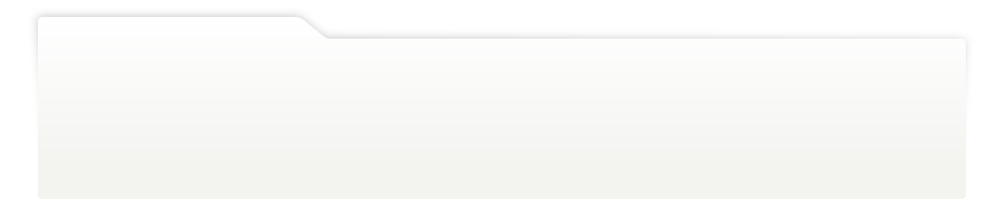
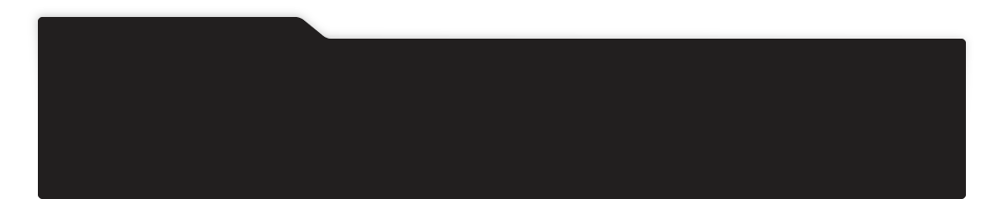
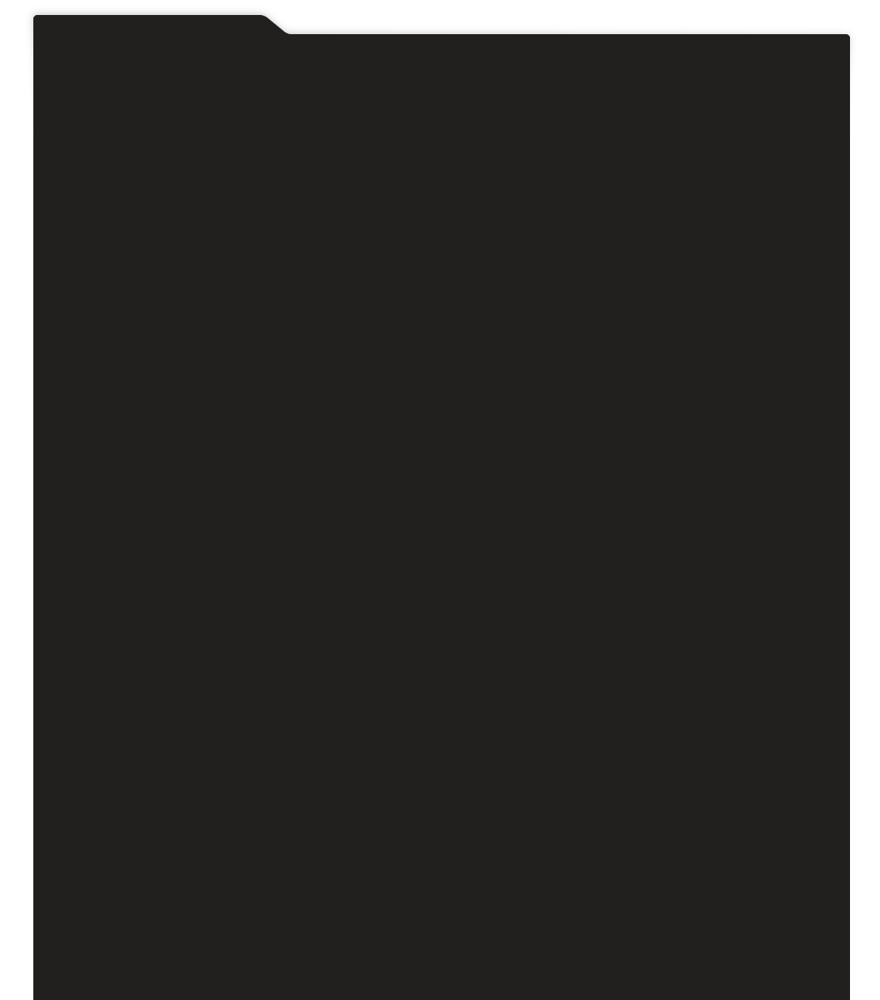
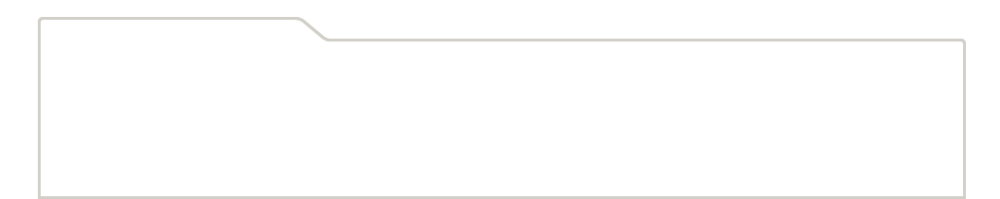
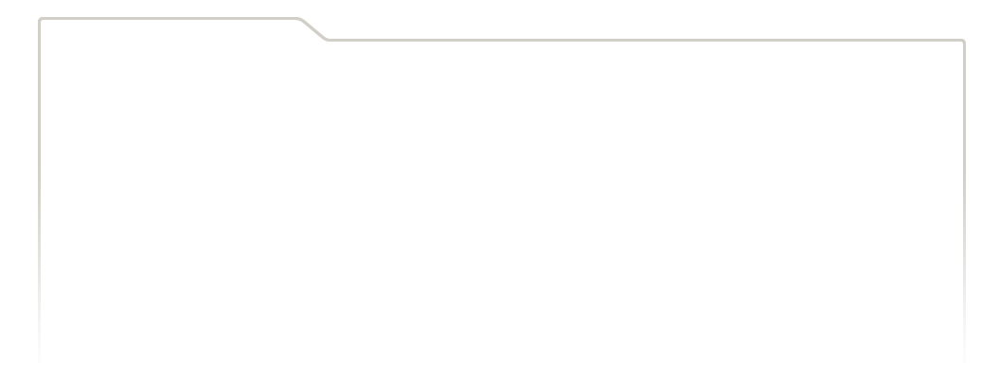
...
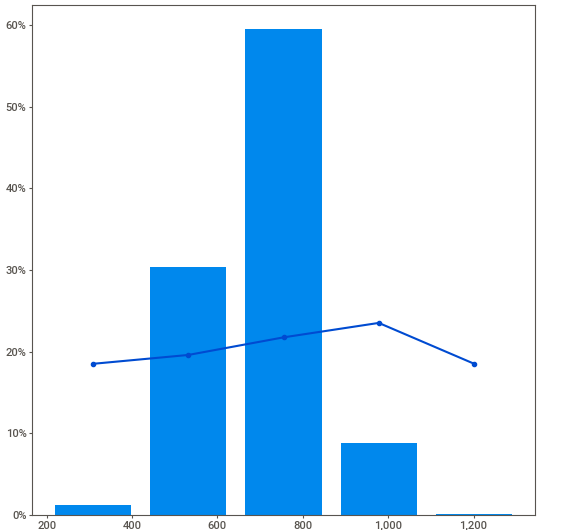
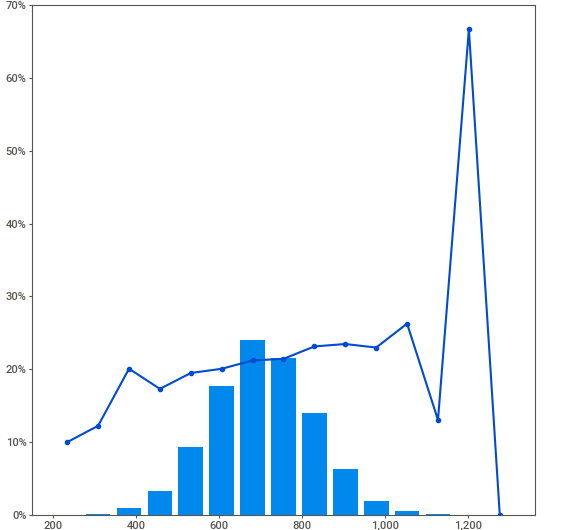
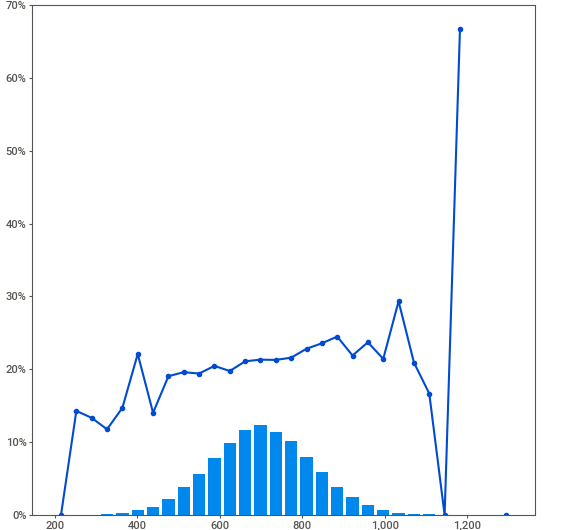
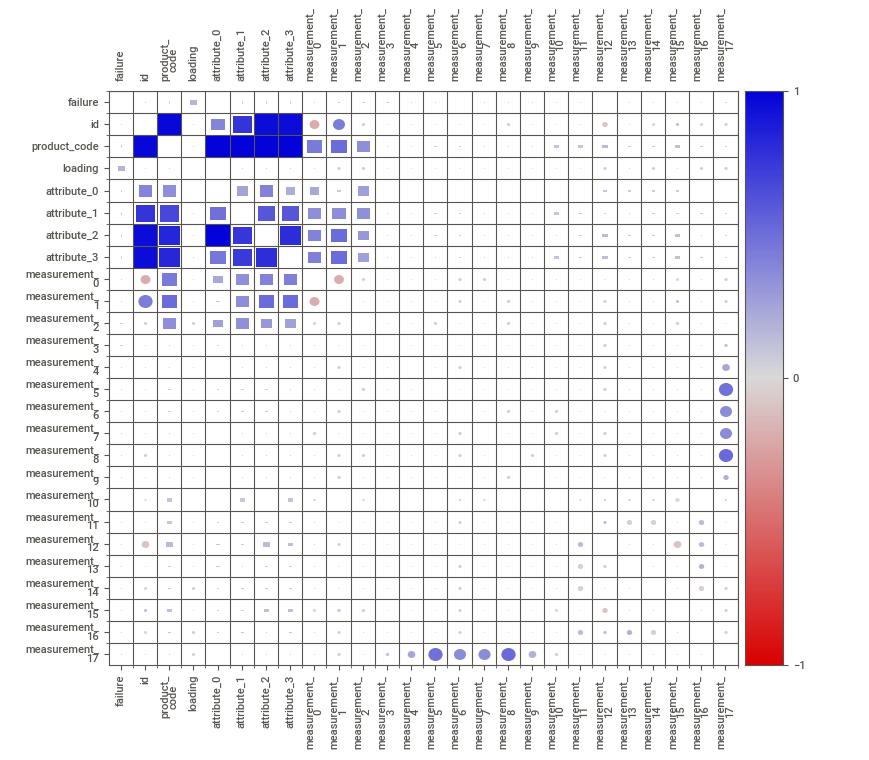
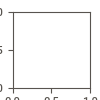

In [3]:

train_report = sv.analyze(train, target_feat="failure")
train_report.show_notebook()

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:03 -> (00:00 left)



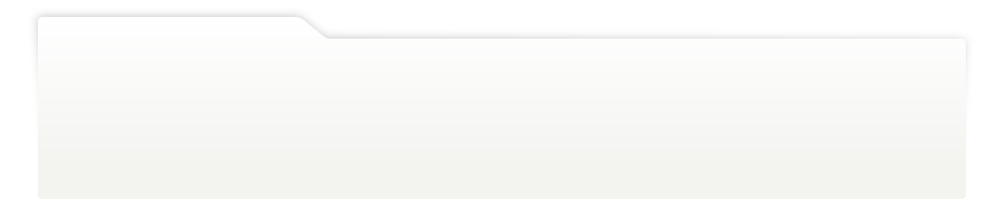
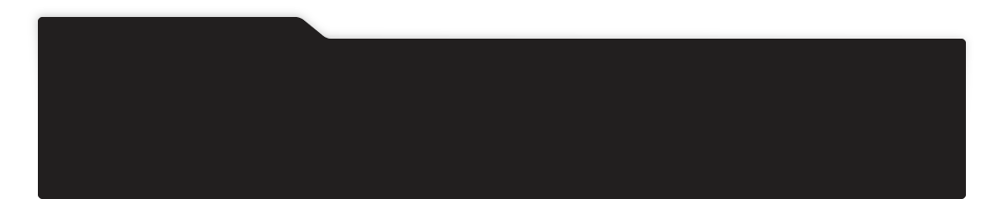
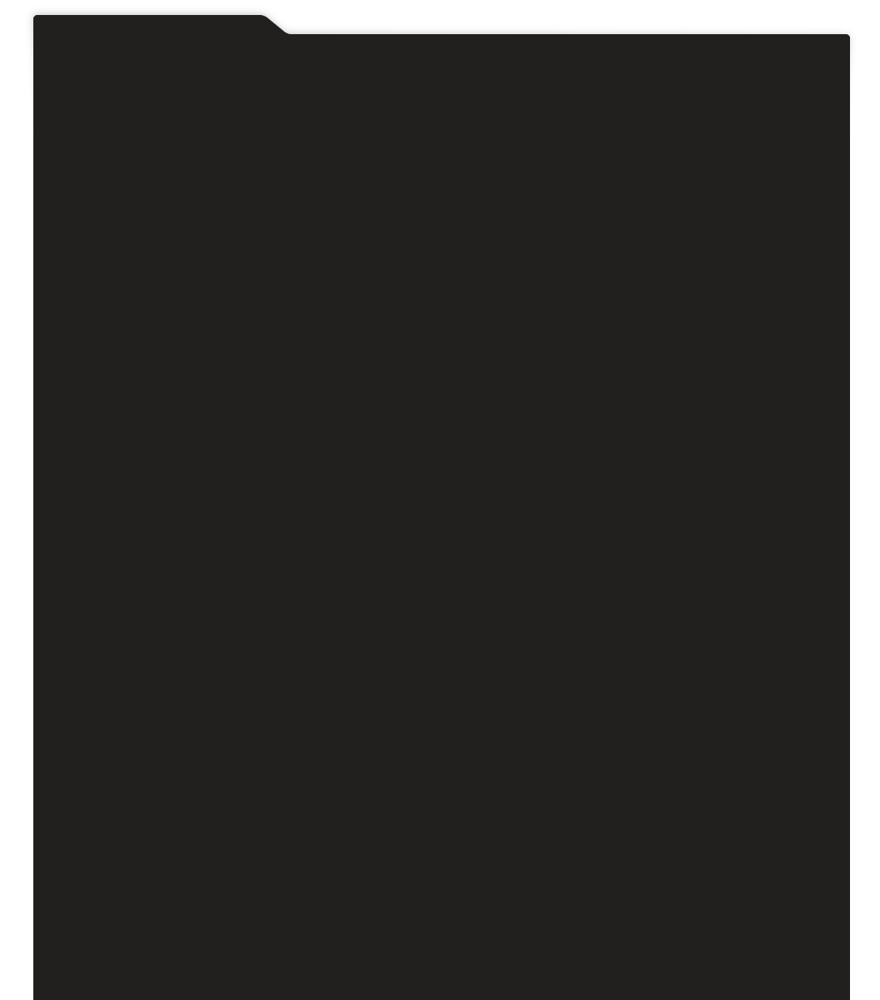
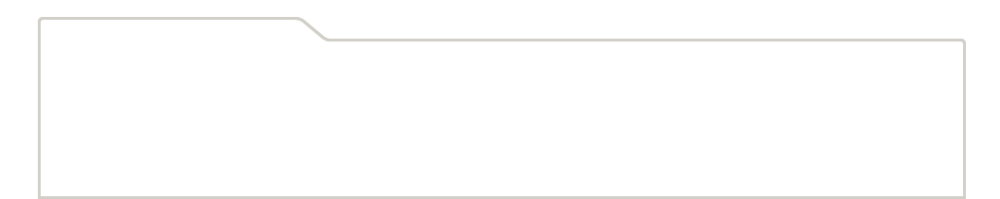
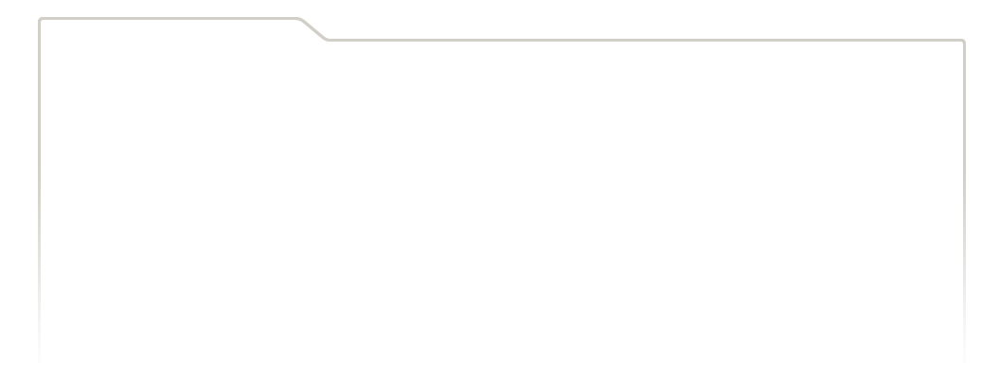
...
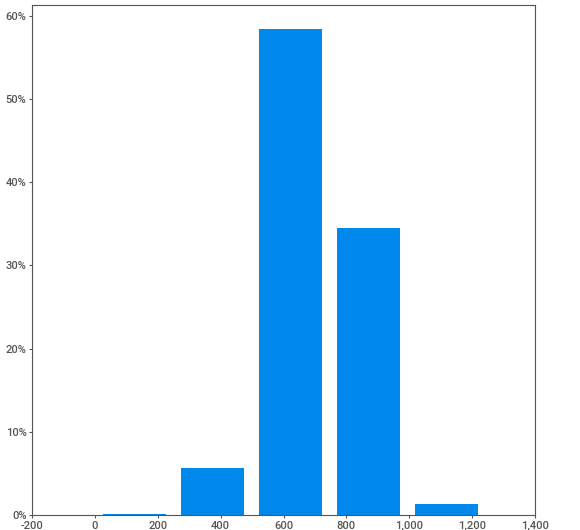
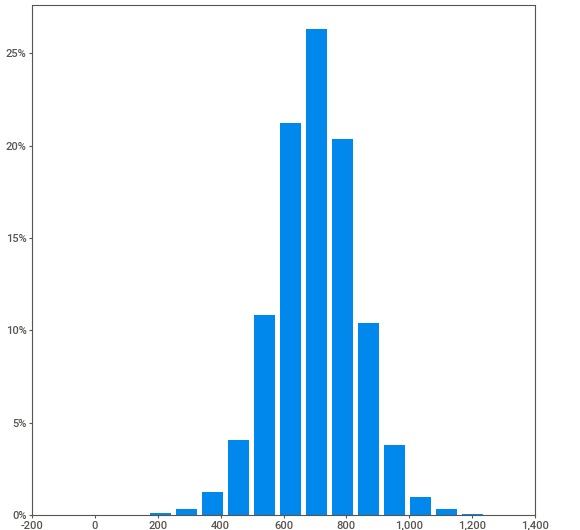
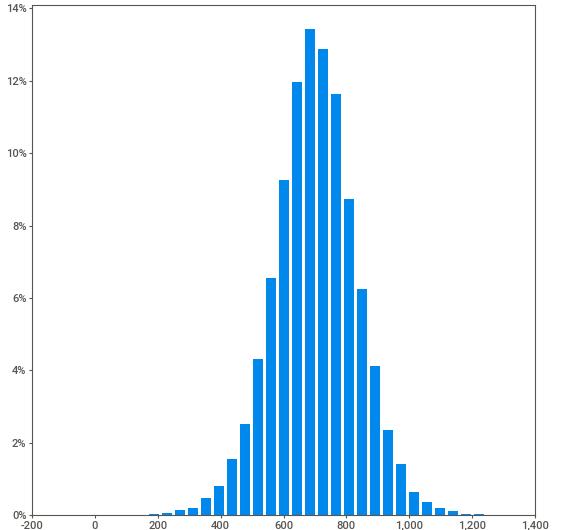
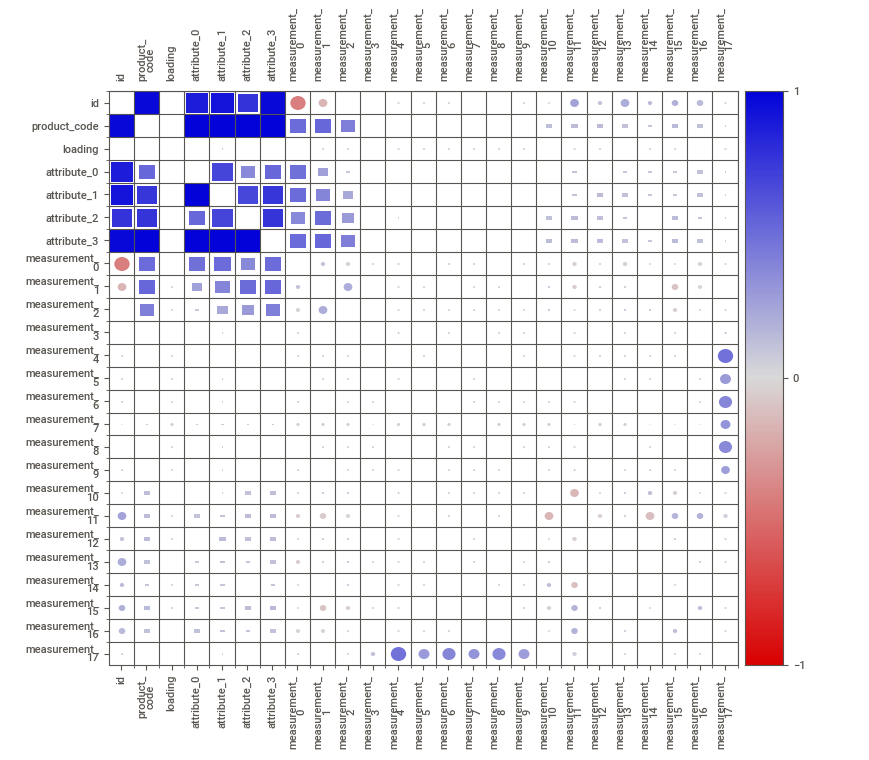
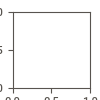

In [4]:
test_report = sv.analyze(test)
test_report.show_notebook()

As mentioned above, only `loading` has a clear correlation with `failure`, and it is not correlated with anything else. The `product_code`, attributes, and measurements seem to have a varying degree of correlations from none to strong to somewhere in between.

The strangest thing though is the strong correlations between measurements 4-9 and 17, especially since measurements 4-9 are not correlated with themselves. This is suspicious, and not something I'd expect to see on a real dataset. It indicates that **measurement 17 is created using a linear combination of measurements 4-9**.

What is more interesting, is the strength of the correlations changes between train and test. For example, the correlation coefficient between measurement 4 and measurement 17 is 0.19 on the train data and 0.45 on the test data. A variation this large seems unlikely due to chance alone. But since the `product_codes` in train vs test are mutually exclusive, looking at correlations broken down by `product_code` might be useful.

### Measurements 4-9 vs 17 broken down by `product_code`

Simple groupby correlation calculations


In [5]:
g = train.groupby("product_code").apply(lambda df: df.corr().loc["measurement_17", [f"measurement_{i}" for i in range(4, 10)]])
g.style.background_gradient(axis=None, vmin=-1, vmax=1).format("{:.2f}")

measurement_17,measurement_4,measurement_5,measurement_6,measurement_7,measurement_8,measurement_9
product_code,,,,,,
A,0.14,0.56,0.28,0.24,0.74,0.02
B,0.40,0.32,0.01,0.80,0.02,0.25
C,0.01,0.43,0.05,0.34,0.76,0.32
D,0.01,0.45,0.69,0.35,0.40,-0.00
E,0.43,0.49,0.55,0.01,0.53,0.14


In [6]:
g = test.groupby("product_code").apply(lambda df: df.corr().loc["measurement_17", [f"measurement_{i}" for i in range(4, 10)]])
g.style.background_gradient(cmap="coolwarm", axis=None).format("{:.2f}")

measurement_17,measurement_4,measurement_5,measurement_6,measurement_7,measurement_8,measurement_9
product_code,,,,,,
F,0.56,0.33,0.57,0.49,0.00,-0.02
G,0.50,0.15,0.61,-0.01,0.48,0.37
H,0.50,0.52,0.03,0.31,0.32,0.52
I,0.20,-0.03,-0.02,0.34,0.79,0.21


The correlations vary significantly from one `product_code` to the other, indicating there might be separate linear models for each `product_code`. If we need to predict `measurement_17` for any reason (such as imputation), one solution could be a linear mixed effects model.

### Feature Importance


#### Process Number 1 - Comparison to Shadow Features

With data where most predictors look pretty unimportant, it can be helpful to create shuffled copies of every feature to see which (if any) look like they could be helpful.

Here's the process:

1. Subset temporarily to numeric columns
2. Create a shuffled copy of every feature, adding to the dataframe (call them shadow features, like Boruta)
3. Measure feature importance using:
      1. AUC with target
      2. correlation with target
4. Identify features that look significantly better than shadow features

In [7]:
def correlation(y_true, y_pred):
    # helper function
    return pd.concat([y_true, y_pred], axis=1).corr().iloc[0, 1]

In [8]:
num_cols = [col for col in train.select_dtypes(np.number).columns if col not in ["id", "failure"]]
rng = np.random.default_rng(5)
num_train_shadows = train[num_cols + ["failure"]].copy()
for col in num_cols:
    arr = num_train_shadows[col].to_numpy()
    num_train_shadows[f"shadow_{col}"] = rng.permutation(arr)

met_funcs = [correlation, roc_auc_score]

row_list = []
groups = rng.choice(5, size=num_train_shadows.shape[0])
for col in num_train_shadows.columns:
    if col in ["id", "failure", "product_code"]:
        continue
    for group in np.unique(groups):
        # mask = num_train_shadows[col].notna() & (groups == group)
        mask = num_train_shadows[col].notna()
        tmp = num_train_shadows[mask].sample(int(0.8 * num_train_shadows.shape[0]), replace=True)
        for met in met_funcs:
            # val = met(num_train_shadows.loc[mask, 'failure'], num_train_shadows.loc[mask, col])
            val = met(tmp.failure, tmp[col])
            row = {
                "metric": met.__name__,
                "score": val,
                "product_code": group,
                "col": col, 
            }
            row_list.append(row)
res = pd.DataFrame(row_list)
res

,metric,score,product_code,col
0,correlation,0.132499,0,loading
1,roc_auc_score,0.588865,0,loading
2,correlation,0.133916,1,loading
3,roc_auc_score,0.593171,1,loading
4,correlation,0.119455,2,loading
...,...,...,...,...
415,roc_auc_score,0.495616,2,shadow_measurement_17
416,correlation,0.004155,3,shadow_measurement_17
417,roc_auc_score,0.502302,3,shadow_measurement_17
418,correlation,-0.001602,4,shadow_measurement_17


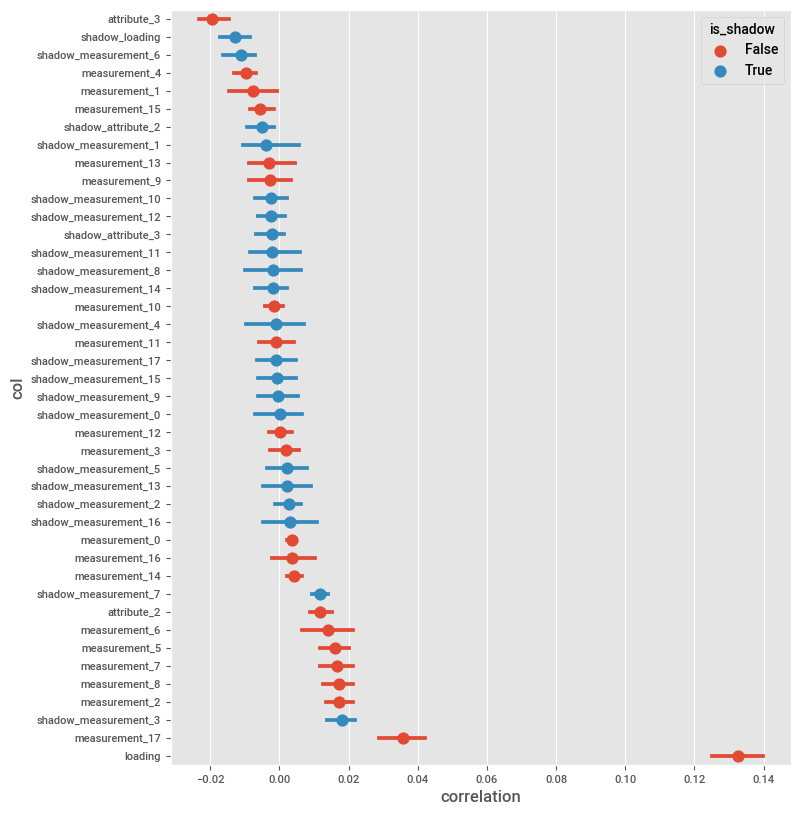

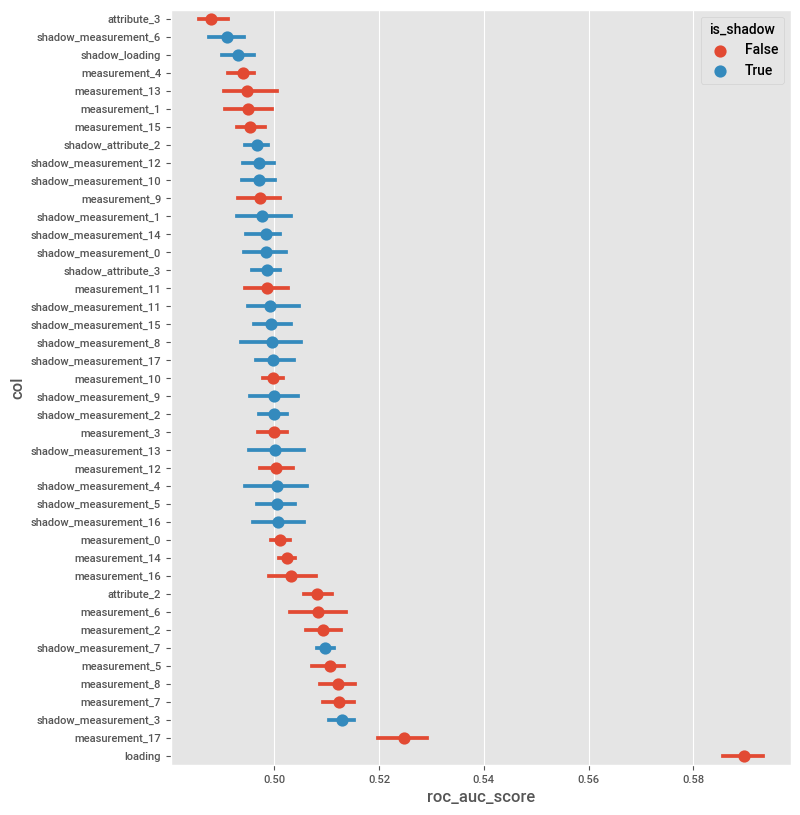

In [11]:
# Set plotting style for rest of notebook
plt.style.use("ggplot")


metric = "roc_auc_score"
for metric in met_funcs:
    met_name = metric.__name__
    fig, ax = plt.subplots(figsize=(8, 10))
    # fig, ax = plt.subplots(dpi=200)
    tmp = res[res.metric == met_name].copy()
    tmp["is_shadow"] = tmp["col"].str.contains("shadow")
    order = tmp.groupby("col")["score"].mean().sort_values()
    sns.pointplot(data=tmp, x="score", y="col", ax=ax, order=order.index, join=False, hue="is_shadow")
    ax.set_xlabel(met_name)
    plt.show()

#### Process Number 2 - Target Shuffling

Motivated by the famous John Elder: <https://www.elderresearch.com/resource/innovations/target-shuffling-process/>

Algorithm:

1. Shuffle every feature many times (e.g., 100 or 1000)
2. Compare the correlation and AUC of the real feature to the many copies
3. Calculate the pseudo-p-value, representing likelihood we'd see this big of a relationship if it was from chance alone.

For speed, we will shuffle the entire dataset all at once.

In [15]:
num_cols = [col for col in train.select_dtypes(np.number).columns if col not in ["id", "failure"]]
rng = np.random.default_rng(5)
n = 100

met_funcs = [correlation, roc_auc_score]
train_num = train[num_cols].copy()
row_list = []
for i in range(n + 1):
    if i == 0:
        tmp = train_num.copy()
    else:
        tmp = train_num.sample(frac=1.0, replace=False, random_state=i)
    tmp["failure"] = train["failure"].to_numpy()
    for col in num_cols:
        mask = tmp[col].notna()
        for met in met_funcs:
            val = met(tmp.loc[mask, "failure"], tmp.loc[mask, col])
            row = {
                "metric": met.__name__,
                "score": val,
                "rs": i,
                "col": col,
            }
            row_list.append(row)
res = pd.DataFrame(row_list)
res



,metric,score,rs,col
0,correlation,0.129089,0,loading
1,roc_auc_score,0.587946,0,loading
2,correlation,0.006337,0,attribute_2
3,roc_auc_score,0.504359,0,attribute_2
4,correlation,-0.019222,0,attribute_3
...,...,...,...,...
4237,roc_auc_score,0.496235,100,measurement_15
4238,correlation,-0.002397,100,measurement_16
4239,roc_auc_score,0.499209,100,measurement_16
4240,correlation,0.004060,100,measurement_17


In [17]:
# P-values
res_ = res.copy()
roc_mask = res_.metric == "roc_auc_score"
res_.loc[roc_mask, "score"] = res_.loc[roc_mask, "score"] - 0.5
g = res_.groupby(["col", "metric"]).apply(lambda df: (df.loc[df.rs == 0, "score"].abs().iloc[0] > df.loc[df.rs > 0, "score"].abs()).mean())
g


col             metric       
attribute_2     correlation      0.69
                roc_auc_score    0.73
attribute_3     correlation      1.00
                roc_auc_score    1.00
loading         correlation      1.00
                roc_auc_score    1.00
measurement_0   correlation      0.94
                roc_auc_score    0.80
measurement_1   correlation      0.91
                roc_auc_score    0.92
measurement_10  correlation      0.19
                roc_auc_score    0.00
measurement_11  correlation      0.49
                roc_auc_score    0.51
measurement_12  correlation      0.43
                roc_auc_score    0.48
measurement_13  correlation      0.30
                roc_auc_score    0.57
measurement_14  correlation      0.74
                roc_auc_score    0.68
measurement_15  correlation      0.41
                roc_auc_score    0.43
measurement_16  correlation      0.28
                roc_auc_score    0.30
measurement_17  correlation      1.00
                roc_

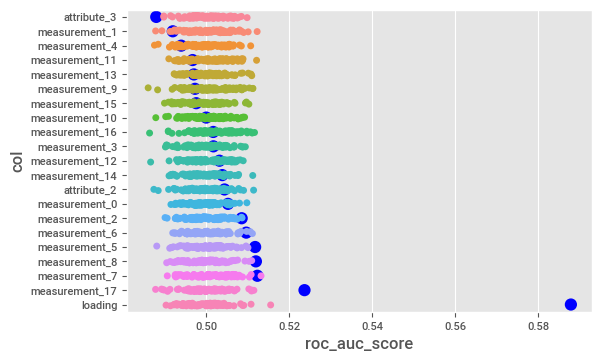

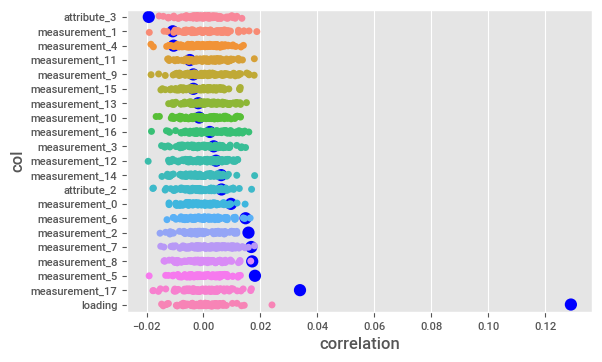

In [32]:

for metric in ["roc_auc_score", "correlation"]:
    fig, ax = plt.subplots()
    order = res.loc[(res.rs == 0) & (res.metric == metric)].sort_values("score")["col"]
    sns.pointplot(data=res[(res.rs == 0) & (res.metric == metric)], x="score", y="col", order=order, join=False, color="blue")
    sns.stripplot(data=res[(res.rs > 0) & (res.metric == metric)], x="score", y="col", order=order)
    ax.set_xlabel(metric)
    plt.show()


Takeaways from this investigation:

* `measurement_17` looks better than random
* `attribute_3` looks slightly better than random, and this is probably a categorical feature, and we didn't even account for that!
* measurements 2, 5, 7, 8 are borderline

We want at least `loading`, `measurement_17`, and probably `attribute_3` in our model.

#### Loading Missingness

There is some indication in the data that the dataset is different when `loading` is missing, most definitively shown in the plot below with `attribute_3`. I will repeat the above feature selection analysis when loading is missing to make sure there's nothing we're missing.



<AxesSubplot:xlabel='failure', ylabel='product_code'>

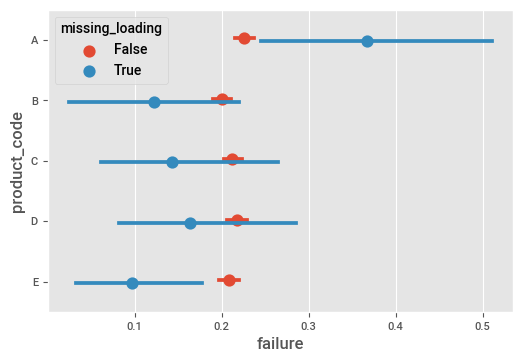

In [33]:
train["missing_loading"] = train.loading.isna().astype("category")
sns.pointplot(data=train, x="failure", y="product_code", hue = "missing_loading", dodge=True, join=False)

In [44]:
n = 100

met_funcs = [correlation, roc_auc_score]
train_num = train.loc[train.loading.isna(), num_cols].copy()

# Test attribute combinations
train_num["2_plus_3"] = train_num.attribute_2 + train_num.attribute_3
train_num["2_times_3"] = train_num.attribute_2 * train_num.attribute_3
train_num["2_over_3"] = train_num.attribute_2 / train_num.attribute_3
train_num["2_minus_3"] = train_num.attribute_2 - train_num.attribute_3
num_cols = [col for col in train_num.select_dtypes(np.number).columns if col not in ["id", "failure"]]


row_list = []
for i in range(n + 1):
    if i == 0:
        tmp = train_num.copy()
    else:
        tmp = train_num.sample(frac=1.0, replace=False, random_state=i)
    tmp["failure"] = train.loc[train.loading.isna(), "failure"].to_numpy()
    for col in num_cols:
        mask = tmp[col].notna()
        if mask.sum() == 0:
            continue
        for met in met_funcs:
            val = met(tmp.loc[mask, "failure"], tmp.loc[mask, col])
            row = {
                "metric": met.__name__,
                "score": val,
                "rs": i,
                "col": col,
            }
            row_list.append(row)
res = pd.DataFrame(row_list)
res



,metric,score,rs,col
0,correlation,0.183629,0,attribute_2
1,roc_auc_score,0.620918,0,attribute_2
2,correlation,-0.222120,0,attribute_3
3,roc_auc_score,0.341019,0,attribute_3
4,correlation,0.115373,0,measurement_0
...,...,...,...,...
4843,roc_auc_score,0.565755,100,2_times_3
4844,correlation,-0.000895,100,2_over_3
4845,roc_auc_score,0.512798,100,2_over_3
4846,correlation,-0.011606,100,2_minus_3


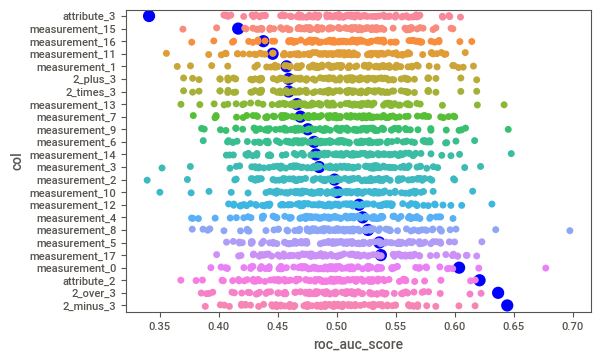

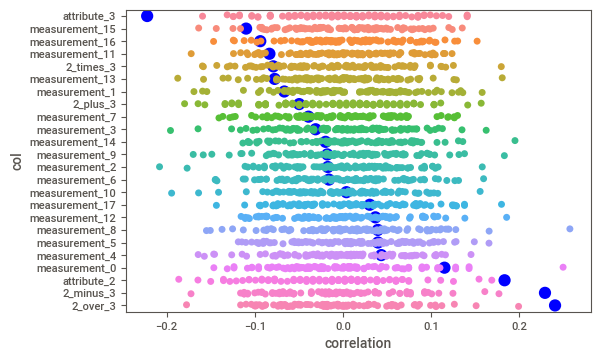

In [45]:

for metric in ["roc_auc_score", "correlation"]:
    fig, ax = plt.subplots()
    order = res.loc[(res.rs == 0) & (res.metric == metric)].sort_values("score")["col"]
    sns.pointplot(data=res[(res.rs == 0) & (res.metric == metric)], x="score", y="col", order=order, join=False, color="blue")
    sns.stripplot(data=res[(res.rs > 0) & (res.metric == metric)], x="score", y="col", order=order)
    ax.set_xlabel(metric)
    plt.show()


Both attributes 2 and 3 have a key relationship when loading is missing. This indicates having a "backup" model might be helpful.

We can use sweetviz to see if the relationship holds across all attributes, and when we treat them as categorical.

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:03 -> (00:00 left)



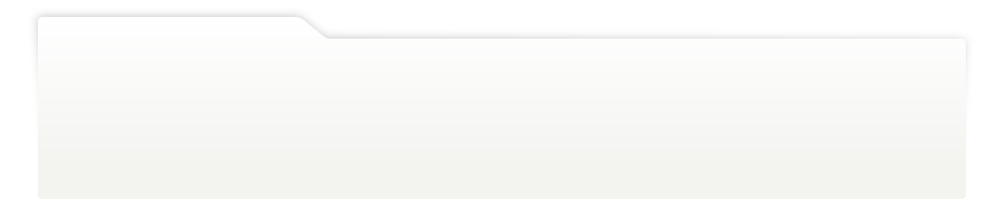
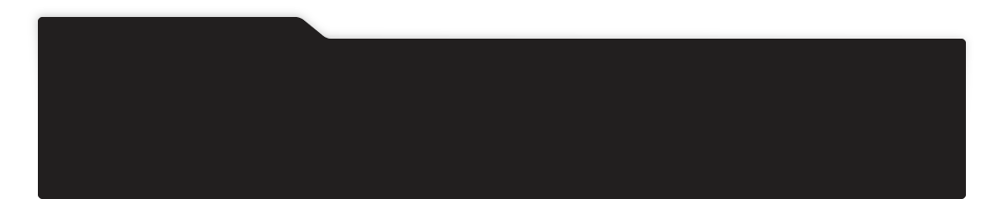
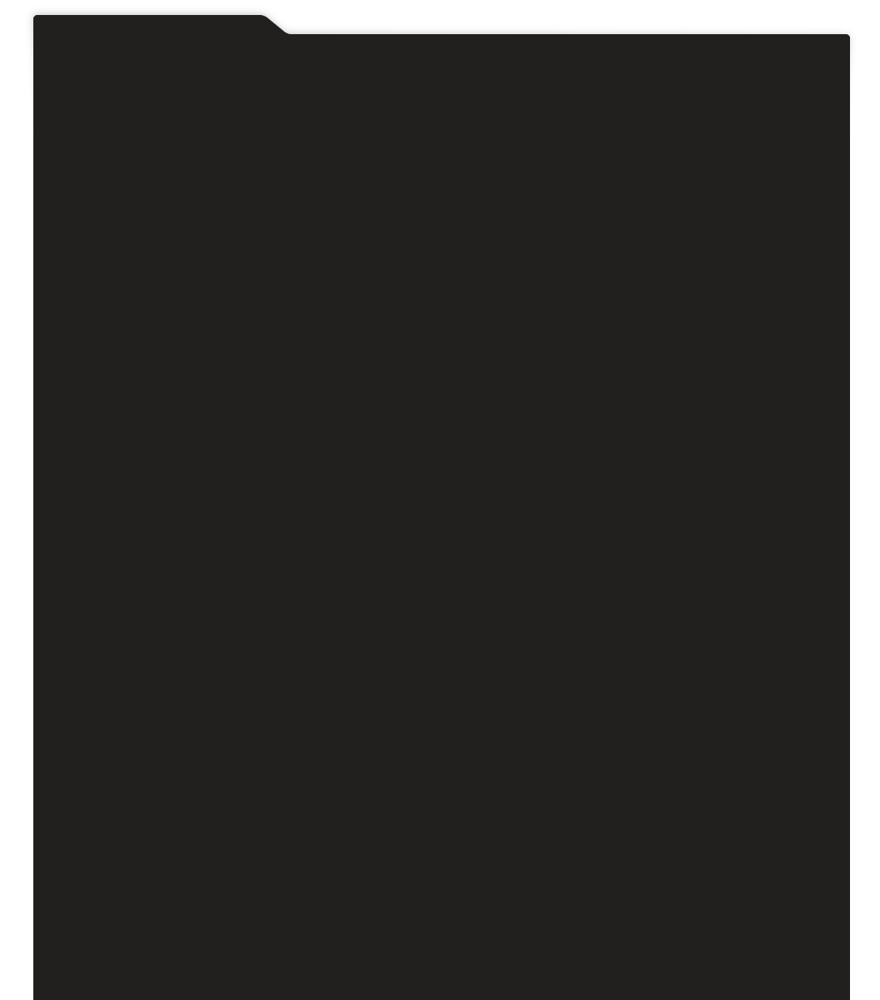
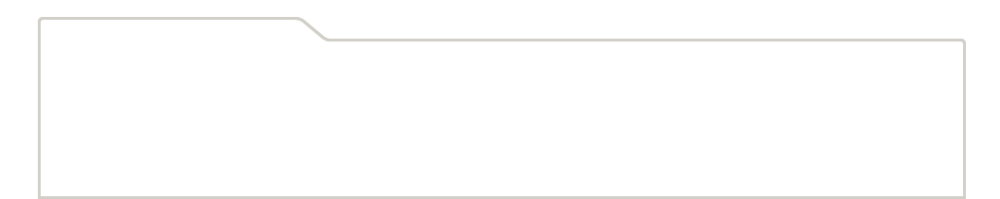
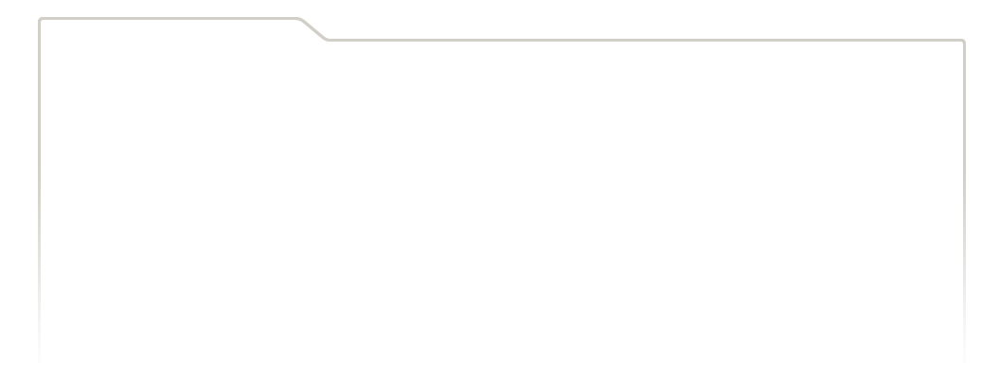
...
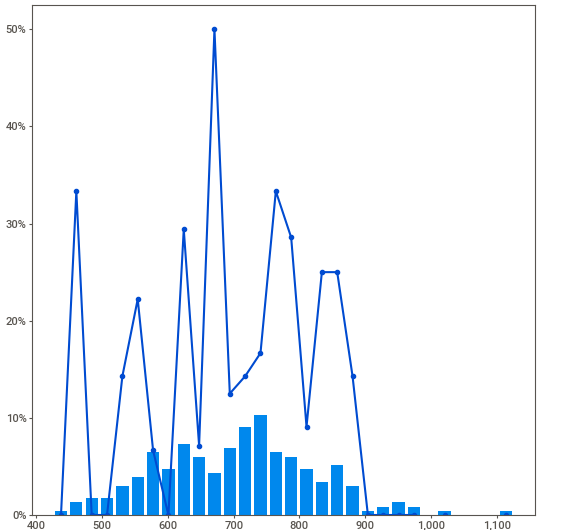
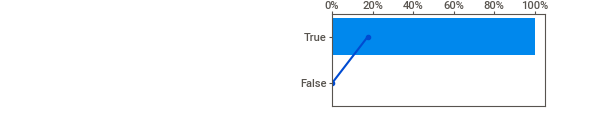
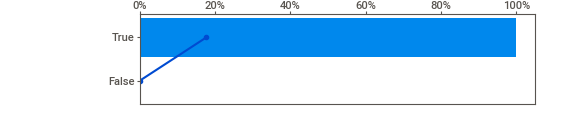
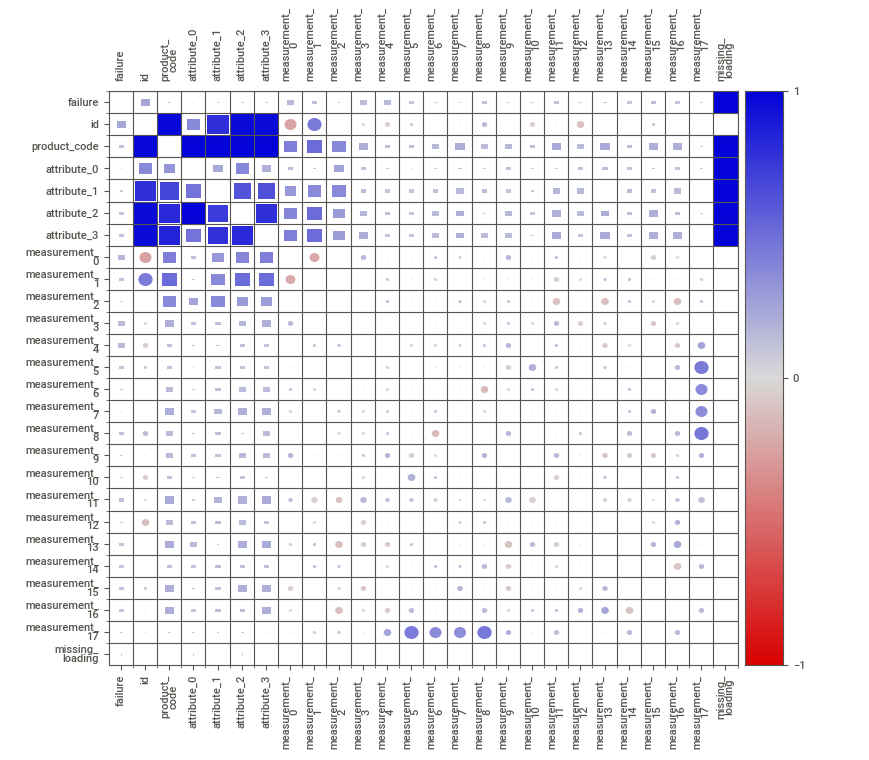
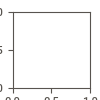

In [ ]:

train_report = sv.analyze(train[train.loading.isna()], target_feat="failure", feat_cfg=sv.FeatureConfig(force_cat=["attribute_2", "attribute_3"]))
train_report.show_notebook()


### Missingness

The missingness patterns are strange/artificial...there's an linearly-increasing percentage of missing values as the measurement numbers get higher.

`meaurement_17` has the highest percent missing, which is a problem given it's the second most valuable feature. This is where having features that predict `measurement_17` well will be helpful.

<AxesSubplot:>

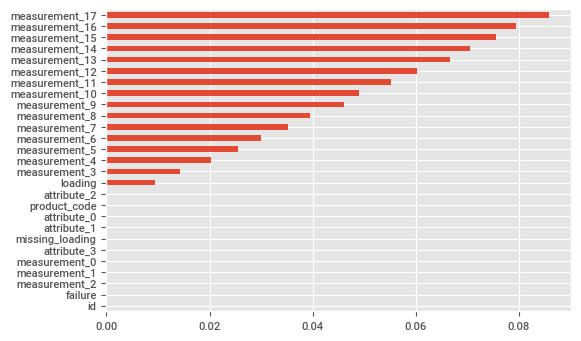

In [39]:
missing = train.isna()
missing.mean().sort_values().plot.barh()

## Modeling

Previous analysis has shown that linear models tend to do better on this problem than tree-based, probably because the dataset is linearly created. Our primary goal for modeling is to build a linear model with some clever imputation:

* Iteratively impute missing values using `product_code` along with the other numeric features (this is mainly for `measurement_17`s sake, but can test applying to all features)
* Use a logistic regression on the imputed values
* Also use `product_code` for explicit CV


This is kind of like doing `cross_val_score` with `IterativeImputer`, but I'm going to code it myself for two reasons:

1. `IterativeImputer` doesn't allow categorical features, so we'd have to leave out `product_code`. We've already demonstrated `product_code` provides valuable information on `measurement_17`, so that's a problem.
2. `cross_val_score` only uses the training data. For iterative imputation, we can actually use the testing predictors to help with the imputation. And we'll need to to submit, since the test data contains new `product_code`s.

We'll also want the ability to use a "backup" model, especially with attributes as features.

### Creating Custom Classifier Class

We can start by creating a scikit-learn classifier object to use for train and testing.

Key Features of `IterativeGroupClassifier`:

1. It uses `X_test` during training, for imputation.
2. It allows for two ways of using `product_code`:
      1. Can be used directly in a model (will be tested using `lightgbm`)
      2. Or it can be used as a grouping variable, and separate models will be fit on each grouping.
3. It allows a "backup" model when the most important feature in the primary model is missing. This is potentially helpful on this problem since `loading` is so valuable but also occassionally missing 


In [50]:
class IterativeGroupClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, iterative_regressor, classifier, backup_est=None, use_backup="partial"):
        self.iterative_regressor = iterative_regressor
        self.classifier = classifier
        if backup_est is None:
            self.backup_est = clone(classifier)
        else:
            self.backup_est = backup_est
        self.use_backup = use_backup

    def _iterative_impute(
        self,
        X: pd.DataFrame,
        group_col: str = None,
        fit: bool = True,
        max_iter: int = 5,
        impute_cols: list[str] = None,
    ):
        """_summary_

        Parameters
        ----------
        X : pd.DataFrame
            _description_
        group_col : str, optional
            If specified, separate imputing models fit to each group, by default None
        fit : bool, optional
            _description_, by default True
        max_iter : int, optional
            _description_, by default 5
        impute_cols : list[str], optional
            If specified, will only impute these columns, by default None

        Returns
        -------
        _type_
            _description_
        """
        # Specify impute cols
        self.impute_cols = impute_cols
        if self.impute_cols is None:
            self.impute_cols = list(X.columns)

        # Perform initial imputations using mean
        complete = X.copy()
        masks = np.zeros(X.shape, dtype=bool)
        for i in range(X.shape[1]):
            masks[:, i] = X.iloc[:, i].notna()
            if ((~masks[:, i]).sum() == 0) | (
                X.columns[i] not in self.impute_cols
            ):
                continue
            complete.iloc[~masks[:, i], i] = X.iloc[masks[:, i], i].mean()
            # complete.iloc[~masks[:, i], i] = X.iloc[masks[:, i], i].median()

        # Iteratively train models
        if fit:
            # Very cool: <https://stackoverflow.com/a/27809959>
            self.models = defaultdict(lambda: defaultdict(dict))
        for i in range(max_iter):
            for j in range(X.shape[1]):
                col = X.columns[j]
                if ((~masks[:, j]).sum() == 0) | (col not in self.impute_cols):
                    continue

                if group_col is None:

                    # Masks for fitting and imputing
                    fit_mask = masks[:, j]
                    pred_mask = ~masks[:, j]
                    if (fit_mask.sum() == 0) | (pred_mask.sum() == 0):
                        # Skip if nothing to fit or predict
                        continue
                    # Fit model
                    curr_pred = [
                        feat for feat in complete.columns if feat not in [col]
                    ]
                    if fit:
                        est = clone(self.iterative_regressor)
                        est.fit(
                            complete.loc[fit_mask, curr_pred],
                            complete.loc[fit_mask, col],
                        )
                        # Save model
                        self.models[i][col] = est

                    # Re-impute missing
                    complete.loc[pred_mask, col] = self.models[i][col].predict(
                        complete.loc[pred_mask, curr_pred]
                    )
                else:
                    for group in complete[group_col].unique():
                        # Masks for fitting and imputing
                        fit_mask = masks[:, j] & (complete[group_col] == group)
                        pred_mask = (~masks[:, j]) & (
                            complete[group_col] == group
                        )

                        if (fit_mask.sum() == 0) | (pred_mask.sum() == 0):
                            # Skip if nothing to fit or predict
                            continue

                        # Fit model
                        curr_pred = [
                            feat
                            for feat in complete.columns
                            if feat not in [col, group_col]
                        ]
                        if fit:
                            est = clone(self.iterative_regressor)
                            est.fit(
                                complete.loc[fit_mask, curr_pred],
                                complete.loc[fit_mask, col],
                            )
                            # Save model
                            self.models[i][col][group] = est

                        # Re-impute missing
                        complete.loc[pred_mask, col] = self.models[i][col][
                            group
                        ].predict(complete.loc[pred_mask, curr_pred])

        return complete

    def fit(
        self,
        X_train,
        y_train,
        X_test,
        return_predictions=True,
        group_col="product_code",
        use_groups=True,
        fs_func=f_classif,
        **impute_params
    ):
        # Combine X datasets
        train_missing = X_train.isna()
        test_missing = X_test.isna()
        n_train = X_train.shape[0]  # For splitting out later
        X = pd.concat([X_train, X_test])

        # Impute
        if use_groups:
            iterative_group_col = group_col
        else:
            iterative_group_col = None
        complete = self._iterative_impute(
            X,
            group_col=iterative_group_col,
            fit=True,
            **impute_params
        )

        # Re-split
        X_train = complete.iloc[:n_train, :]
        X_test = complete.iloc[n_train:, :]

        # Fit model
        if self.use_backup == "None":
            self.classifier.fit(X_train.drop(columns=group_col), y_train)
        else:
            # Get best col
            f_stat, pvals = fs_func(X_train.drop(columns=group_col), y_train)
            self.backup_col = X_train.columns[f_stat.argmax()]

            mask = train_missing[self.backup_col]

            # Fit primary
            self.classifier.fit(
                X_train[~mask].drop(columns=group_col), y_train[~mask]
            )

            # Fit backup
            self.backup_est.fit(
                X_train[mask].drop(columns=[group_col, self.backup_col]),
                y_train[mask],
            )

        # Get predictions if specified
        if return_predictions:
            if self.use_backup == "None":
                return self.classifier.predict_proba(
                    X_test.drop(columns=group_col)
                )
            else:
                y_pred = np.zeros((X_test.shape[0], 2))
                mask = test_missing[self.backup_col]

                # Make primary predictions
                y_pred[~mask, :] = self.classifier.predict_proba(
                    X_test[~mask].drop(columns=group_col)
                )

                # Make backup predictions
                y_pred[mask, :] = self.backup_est.predict_proba(
                    X_test[mask].drop(columns=[group_col, self.backup_col])
                )
                if self.use_backup == "partial":
                    # Add in primary predictions
                    y_pred[mask, :] += self.classifier.predict_proba(
                        X_test[mask].drop(columns=group_col)
                    )

                    # Divide by 2
                    y_pred[mask, :] /= 2
                return y_pred
        else:
            return self.classifier

    def predict(self, X_test, group_col="product_code"):
        # Impute
        test_missing = X_test.isna()
        X_test = self._iterative_impute(X_test, group_col=group_col, fit=False)

        # Predict
        if self.backup_est is None:
            return self.classifier.predict_proba(
                X_test.drop(columns=group_col)
            )
        else:
            y_pred = np.zeros((X_test.shape[0], 2))
            mask = test_missing[self.backup_col]

            # Make primary predictions
            y_pred[~mask, :] = self.classifier.predict_proba(
                X_test[~mask].drop(columns=group_col)
            )

            # Make backup predictions
            y_pred[mask, :] = self.backup_est.predict_proba(
                X_test[mask].drop(columns=[group_col, self.backup_col])
            )
            if self.use_backup == "partial":
                # Add in primary predictions
                y_pred[mask, :] += self.classifier.predict_proba(
                    X_test[mask].drop(columns=group_col)
                )

                # Divide by 2
                y_pred[mask, :] /= 2
            return y_pred


### Run CV

The cross validation process needs access to the test dataset, so we have to write our own function.


In [51]:
# Define feature selection function
def fs_func(X, y):
    X_ = SimpleImputer().fit_transform(X)
    return f_classif(X_, y)

def cv_eval(est, X, y, group_col, metrics, test_groups=1, **fit_params):
    """Custom Cross validation

    Parameters
    ----------
    est : _type_
        _description_
    X : _type_
        _description_
    y : _type_
        _description_
    group_col : _type_
        _description_
    metrics : _type_
        _description_
    test_groups : int, optional
        How many product_codes to have in the test fold at a time, by default 1
    use_groups : bool, optional
        _description_, by default True

    Returns
    -------
    _type_
        _description_
    """
    
    # Copy and scale
    ss = StandardScaler()
    X_ = X.copy()
    num_cols = X_.select_dtypes(np.number).columns
    X_[num_cols] = ss.fit_transform(X[num_cols])

    # Run tests
    row_list = []
    estimators = []
    all_group_sets = combinations(X_[group_col].unique(), test_groups)
    for group_set in all_group_sets:
        row = {"group": group_set}
        print(group_set)

        # Get train and test groups
        test_mask = X_[group_col].isin(group_set)
        print(test_mask.mean())
        X_train, X_test = X_[~test_mask].copy(), X_[test_mask].copy()
        y_train, y_test = y[~test_mask].copy(), y[test_mask].copy()

        # Train and make predictions
        curr_est = clone(est)
        y_pred = curr_est.fit(
            X_train, y_train, X_test, return_predictions=True, group_col=group_col, **fit_params
        )[:, 1]

        # Evaluate
        for met in metrics:
            val = met(y_test, y_pred)
            row[met.__name__] = val
        row_list.append(row)
        estimators.append(curr_est)

    return estimators, pd.DataFrame(row_list)


### Run Tests

A couple things I know from prior testing/eda:

* Small subsets of features (~3) perform much better than large subsets in the classifier model
* Linear models are better than tree-based

There are a few key parameters I want to test:

1. Using lgbmregressor with `product_code` in the model vs Ridge on each product_code grouping
1. Using all features vs just those clearly helpful from EDA in predicting `failure` or `measurement_17` in the imputation process
1. Using a backup model for when `loading` is missing
1. Number of features in actual classifier model--2 or 3 and 1, 2, or 3 backup?

#### Test Groups = 2

In [52]:
from sklearn.impute import SimpleImputer


num_cols = [col for col in train.select_dtypes(np.number).columns if col not in ["id", "failure"]]
pred_cols = [col for col in num_cols if col not in ["id", "failure"]]


train_ = train.copy()
train_.product_code = train_.product_code.astype("category")



# Define iterative regressor
regressor = Pipeline([("si", SimpleImputer()), ("clf", Ridge())])

# Define classifier(s)
clf_primary = Pipeline(
    [
        ("si", SimpleImputer(strategy="median")),
        ("fs", SelectKBest(k=2)),
        ("lr", LogisticRegression(max_iter=400)),
    ]
)
clf_backup = Pipeline(
    [
        ("si", SimpleImputer(strategy="mean")),
        ("fs", SelectKBest(k=3)),
        ("lr", LogisticRegression(max_iter=400)),
    ]
)
est = IterativeGroupClassifier(
    regressor, clf_primary, backup_est=clf_backup
)
# est = IterativeGroupClassifier(
#     regressor, clf_primary
# )
# Subset if desired
curr_pred = [
    "loading",
    "attribute_3",
    "measurement_17",
] + [f"measurement_{i}" for i in range(4, 10)]
estimators, res = cv_eval(
    est,
    train_[curr_pred + ["product_code"]],
    train_["failure"],
    group_col="product_code",
    metrics=[roc_auc_score],
    test_groups=1,
    use_groups=True,
    impute_cols=["measurement_17"],
    fs_func=fs_func
)

res


('A',)
0.19194580353782462
('B',)
0.19759126834776064
('C',)
0.2169740308618743
('D',)
0.1923974407226195
('E',)
0.20109145652992097


,group,roc_auc_score
0,"(A,)",0.590414
1,"(B,)",0.590580
2,"(C,)",0.588320
3,"(D,)",0.596529
4,"(E,)",0.584170


In [53]:
res.mean()

C:\Users\robert.robison\AppData\Local\Temp/ipykernel_7808/2084554795.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  res.mean()


roc_auc_score    0.590003
dtype: float64

In [71]:
num_cols = [
    col
    for col in train.select_dtypes(np.number).columns
    if col not in ["id", "failure"]
]
pred_cols = [col for col in num_cols if col not in ["id", "failure"]]


train_ = train.copy()
train_.product_code = train_.product_code.astype("category")

df_list = []
for use_lightgbm in [True, False]:
    for subset in [True, False]:
        for k_primary in [2, 3]:
            for k_backup in [0, 1, 2, 3]:
                for only_17 in [True, False]:
                    print(
                        f"{use_lightgbm = } {subset = } {k_primary = } {k_backup = }"
                    )

                    # Define iterative regressor
                    if use_lightgbm:
                        regressor = LGBMRegressor(
                            n_estimators=30, num_leaves=5
                        )
                    else:
                        regressor = Pipeline(
                            [("si", SimpleImputer()), ("clf", Ridge())]
                        )

                    # Define classifier(s)
                    clf_primary = Pipeline(
                        [
                            ("si", SimpleImputer()),
                            ("fs", SelectKBest(k=k_primary)),
                            ("lr", LogisticRegression(max_iter=400)),
                        ]
                    )
                    if k_backup > 0:
                        clf_backup = Pipeline(
                            [
                                ("si", SimpleImputer()),
                                ("fs", SelectKBest(k=k_backup)),
                                ("lr", LogisticRegression(max_iter=400)),
                            ]
                        )
                        est = IterativeGroupClassifier(
                            regressor, clf_primary, backup_est=clf_backup
                        )
                    else:
                        est = IterativeGroupClassifier(regressor, clf_primary)

                    # Subset if desired
                    if subset:
                        curr_pred = [
                            "loading",
                            "attribute_3",
                            "measurement_17",
                        ] + [f"measurement_{i}" for i in range(4, 10)]
                    else:
                        curr_pred = list(pred_cols)

                    # Set imputation columns
                    if only_17:
                        impute_cols = ["measurement_17"]
                    else:
                        impute_cols = None
                    estimators, res = cv_eval(
                        est,
                        train_[curr_pred + ["product_code"]],
                        train_["failure"],
                        group_col="product_code",
                        metrics=[roc_auc_score],
                        test_groups=2,
                        use_groups=not use_lightgbm,
                        impute_cols=impute_cols,
                        fs_func=fs_func,
                    )
                    res["use_lightgbm"] = use_lightgbm
                    res["subset"] = subset
                    res["k_primary"] = k_primary
                    res["k_backup"] = k_backup
                    res["only_17"] = only_17
                    df_list.append(res)
results = pd.concat(df_list)


use_lightgbm = True subset = True k_primary = 2 k_backup = 0
('A', 'B')
0.38953707188558523
('A', 'C')
0.4089198343996989
('A', 'D')
0.3843432442604441
('A', 'E')
0.3930372600677456
('B', 'C')
0.4145652992096349
('B', 'D')
0.38998870907038014
('B', 'E')
0.3986827248776816
('C', 'D')
0.4093714715844938
('C', 'E')
0.4180654873917953
('D', 'E')
0.39348889725254044
use_lightgbm = True subset = True k_primary = 2 k_backup = 0
('A', 'B')
0.38953707188558523
('A', 'C')
0.4089198343996989
('A', 'D')
0.3843432442604441
('A', 'E')
0.3930372600677456
('B', 'C')
0.4145652992096349
('B', 'D')
0.38998870907038014
('B', 'E')
0.3986827248776816
('C', 'D')
0.4093714715844938
('C', 'E')
0.4180654873917953
('D', 'E')
0.39348889725254044
use_lightgbm = True subset = True k_primary = 2 k_backup = 1
('A', 'B')
0.38953707188558523
('A', 'C')
0.4089198343996989
('A', 'D')
0.3843432442604441
('A', 'E')
0.3930372600677456
('B', 'C')
0.4145652992096349
('B', 'D')
0.38998870907038014
('B', 'E')
0.3986827248776816

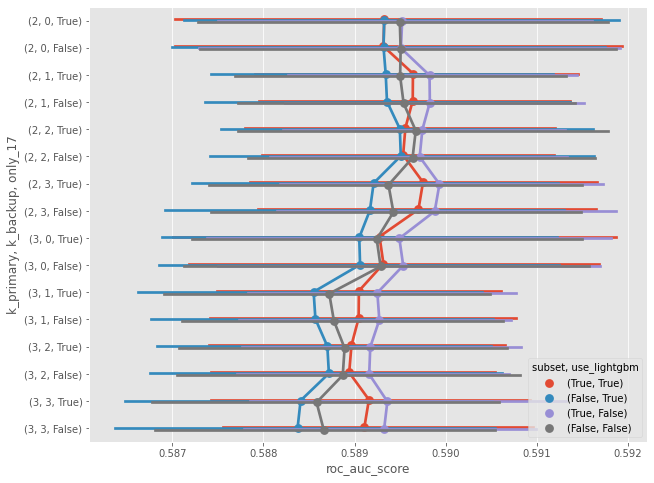

In [79]:

vert_cols = ["k_primary", "k_backup", "only_17"]
hue_cols = ["subset", "use_lightgbm"]

fig, ax = plt.subplots(figsize=(10, 8))
sns.pointplot(data=results, x="roc_auc_score", y=results[vert_cols].apply(tuple, axis=1), hue=results[hue_cols].apply(tuple, axis=1), ax=ax, dodge=True)
ax.set_ylabel(", ".join(vert_cols))
ax.legend(title=", ".join(hue_cols))
plt.show()

The clearest differentiator here is using a subset without lightgbm seems to be the best, and less features are generally better than more.

Using 2 features in the primary model with 1, 2, or 3 in the backup scores the best.


#### Test Groups = 1


In [81]:
num_cols = [
    col
    for col in train.select_dtypes(np.number).columns
    if col not in ["id", "failure"]
]
pred_cols = [col for col in num_cols if col not in ["id", "failure"]]


train_ = train.copy()
train_.product_code = train_.product_code.astype("category")

df_list = []
for use_lightgbm in [True, False]:
    for subset in [True, False]:
        for k_primary in [2, 3]:
            for k_backup in [0, 1, 2, 3]:
                for only_17 in [True, False]:
                    print(
                        f"{use_lightgbm = } {subset = } {k_primary = } {k_backup = }"
                    )

                    # Define iterative regressor
                    if use_lightgbm:
                        regressor = LGBMRegressor(
                            n_estimators=30, num_leaves=5
                        )
                    else:
                        regressor = Pipeline(
                            [("si", SimpleImputer()), ("clf", Ridge())]
                        )

                    # Define classifier(s)
                    clf_primary = Pipeline(
                        [
                            ("si", SimpleImputer()),
                            ("fs", SelectKBest(k=k_primary)),
                            ("lr", LogisticRegression(max_iter=400)),
                        ]
                    )
                    if k_backup > 0:
                        clf_backup = Pipeline(
                            [
                                ("si", SimpleImputer()),
                                ("fs", SelectKBest(k=k_backup)),
                                ("lr", LogisticRegression(max_iter=400)),
                            ]
                        )
                        est = IterativeGroupClassifier(
                            regressor, clf_primary, backup_est=clf_backup
                        )
                    else:
                        est = IterativeGroupClassifier(regressor, clf_primary)

                    # Subset if desired
                    if subset:
                        curr_pred = [
                            "loading",
                            "attribute_3",
                            "measurement_17",
                        ] + [f"measurement_{i}" for i in range(4, 10)]
                    else:
                        curr_pred = list(pred_cols)

                    # Set imputation columns
                    if only_17:
                        impute_cols = ["measurement_17"]
                    else:
                        impute_cols = None
                    estimators, res = cv_eval(
                        est,
                        train_[curr_pred + ["product_code"]],
                        train_["failure"],
                        group_col="product_code",
                        metrics=[roc_auc_score],
                        test_groups=1,
                        use_groups=not use_lightgbm,
                        impute_cols=impute_cols,
                        fs_func=fs_func,
                    )
                    res["use_lightgbm"] = use_lightgbm
                    res["subset"] = subset
                    res["k_primary"] = k_primary
                    res["k_backup"] = k_backup
                    res["only_17"] = only_17
                    df_list.append(res)
results1 = pd.concat(df_list)


use_lightgbm = True subset = True k_primary = 2 k_backup = 0
('A',)
0.19194580353782462
('B',)
0.19759126834776064
('C',)
0.2169740308618743
('D',)
0.1923974407226195
('E',)
0.20109145652992097
use_lightgbm = True subset = True k_primary = 2 k_backup = 0
('A',)
0.19194580353782462
('B',)
0.19759126834776064
('C',)
0.2169740308618743
('D',)
0.1923974407226195
('E',)
0.20109145652992097
use_lightgbm = True subset = True k_primary = 2 k_backup = 1
('A',)
0.19194580353782462
('B',)
0.19759126834776064
('C',)
0.2169740308618743
('D',)
0.1923974407226195
('E',)
0.20109145652992097
use_lightgbm = True subset = True k_primary = 2 k_backup = 1
('A',)
0.19194580353782462
('B',)
0.19759126834776064
('C',)
0.2169740308618743
('D',)
0.1923974407226195
('E',)
0.20109145652992097
use_lightgbm = True subset = True k_primary = 2 k_backup = 2
('A',)
0.19194580353782462
('B',)
0.19759126834776064
('C',)
0.2169740308618743
('D',)
0.1923974407226195
('E',)
0.20109145652992097
use_lightgbm = True subset = T

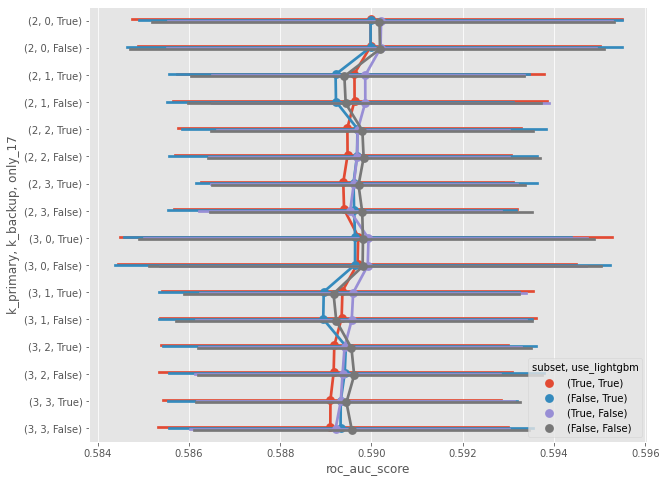

In [82]:

vert_cols = ["k_primary", "k_backup", "only_17"]
hue_cols = ["subset", "use_lightgbm"]

fig, ax = plt.subplots(figsize=(10, 8))
sns.pointplot(data=results1, x="roc_auc_score", y=results1[vert_cols].apply(tuple, axis=1), hue=results1[hue_cols].apply(tuple, axis=1), ax=ax, dodge=True)
ax.set_ylabel(", ".join(vert_cols))
ax.legend(title=", ".join(hue_cols))
plt.show()

So using a single fold does indeed give different answers. The first thing to notice is the scale--there's more variance in this bootstrapped CI's in this approach, but less variance in the means. We see the same general signal that 2 primary features is a little better than three, but no longer see subsettning as better than not.

The best model uses 2 primary features with no backup and no lightgbm, whether subsetting or not.

## Test Submissions

The Public LB is basically another CV fold, with maybe _slightly_ more weight. Since so many solutions perform so similarly on tests, it could be a helpful differentiator.

The solutions that seem the best use 2 features in the primary model and a backup model with 1 or 3 features. The question is does the performance boost justify the added complexity?



In [76]:
k_loading = 2
k_backup = 3
subset = False
impute_method="median"

if subset:
    curr_pred = [
        "loading",
        "attribute_3",
        "measurement_17",
    ] + [f"measurement_{i}" for i in range(4, 10)]
else:
    curr_pred = list(pred_cols)
clf_primary = Pipeline(
    [
        ("si", SimpleImputer(strategy=impute_method)),
        ("fs", SelectKBest(k=k_loading)),
        ("lr", LogisticRegression(max_iter=400)),
    ]
)
if k_backup > 0:
    clf_backup = Pipeline([("fs", SelectKBest(k=k_backup)), ("lr", LogisticRegression(max_iter=400, C=1))])
    est = IterativeGroupClassifier(Ridge(), clf_primary, backup_est=clf_backup)
else:
    est = IterativeGroupClassifier(Ridge(), clf_primary)

y_pred = est.fit(train[curr_pred + ["product_code"]], train["failure"], test[curr_pred + ["product_code"]], return_predictions=True)
tmp = test[["id"]].copy()
tmp["failure"] = y_pred[:, 1]
print(tmp.isna().sum())
tmp.head()

id         0
failure    0
dtype: int64


,id,failure
0,26570,0.191405
1,26571,0.174865
2,26572,0.185209
3,26573,0.179489
4,26574,0.341734


In [81]:
from pathlib import Path

dfs = []
pred_dir = Path("../data/predictions")
for file in pred_dir.iterdir():
    if str(file.name).startswith("IterativeGroup"):
        curr = pd.read_csv(file)
        curr["name"] = file.name
        dfs.append(curr)
curr = tmp.copy()
name = f"IterativeGroupImputer_kload{k_loading}_kback{k_backup}_subset{subset}_strat{impute_method}_new2.csv"
curr["name"] = name
dfs.append(curr)
all_preds = pd.concat(dfs)
pd.pivot_table(all_preds, index="id", columns="name").corr()

failure  \
name                                                       IterativeGroupImputer_kload2_kback0.csv   
        name                                                                                         
failure IterativeGroupImputer_kload2_kback0.csv                                           1.000000   
        IterativeGroupImputer_kload2_kback0_subsetTrue_...                                0.999821   
        IterativeGroupImputer_kload2_kback2.csv                                           0.982275   
        IterativeGroupImputer_kload2_kback3.csv                                           0.984265   
        IterativeGroupImputer_kload2_kback3_subsetFalse...                                0.930079   
        IterativeGroupImputer_kload2_kback3_subsetTrue.csv                                0.970605   
        IterativeGroupImputer_kload2_kback3_subsetTrue_...                                0.555035   
        IterativeGroupImputer_kload3_kback0.csv                                           0.982570   

                                                                                                                           \
name                                                       IterativeGroupImputer_kload2_kback0_subsetTrue_stratmedian.csv   
        name                                                                                                                
failure IterativeGroupImputer_kload2_kback0.csv                                                      0.999821               
        IterativeGroupImputer_kload2_kback0_subsetTrue_...                                           1.000000               
        IterativeGroupImputer_kload2_kback2.csv                                                      0.982067               
        IterativeGroupImputer_kload2_kback3.csv                                                      0.984087               
        IterativeGroupImputer_kload2_kback3_subsetFalse...                                           0.929964               
        IterativeGroupImputer_kload2_kback3_subsetTrue.csv                                           0.970707               
        IterativeGroupImputer_kload2_kback3_subsetTrue_...                                           0.555065               
        IterativeGroupImputer_kload3_kback0.csv                                                      0.982385               

                                                                                                    \
name                                                       IterativeGroupImputer_kload2_kback2.csv   
        name                                                                                         
failure IterativeGroupImputer_kload2_kback0.csv                                           0.982275   
        IterativeGroupImputer_kload2_kback0_subsetTrue_...                                0.982067   
        IterativeGroupImputer_kload2_kback2.csv                                           1.000000   
        IterativeGroupImputer_kload2_kback3.csv                                           0.999212   
        IterativeGroupImputer_kload2_kback3_subsetFalse...                                0.885517   
        IterativeGroupImputer_kload2_kback3_subsetTrue.csv                                0.994185   
        IterativeGroupImputer_kload2_kback3_subsetTrue_...                                0.610669   
        IterativeGroupImputer_kload3_kback0.csv                                           0.968364   

                                                                                                    \
name                                                       IterativeGroupImputer_kload2_kback3.csv   
        name                                                                                         
failure IterativeGroupImputer_kload2_kback0.csv                                           0.984265   
        IterativeGroupImputer_kload2_kback0_subsetTrue_...   

In [77]:
curr_est = est.backup_est
fi = pd.Series(curr_est["lr"].coef_[0], index=curr_est["fs"].get_feature_names_out())
fi

attribute_2      0.124217
attribute_3     -0.281434
measurement_0    0.021510
dtype: float64

In [41]:
curr_est = est.classifier
fi = pd.Series(curr_est["lr"].coef_[0], index=curr_est["fs"].get_feature_names_out())
fi

x0    0.007648
x2    0.000656
dtype: float64

In [39]:
tmp_old = tmp.copy()

In [43]:
preds = tmp.copy()
preds = preds.rename(columns={"failure": "no_backup"})
preds["backup"] = tmp_old.failure
preds["loading"] = test.loading
preds["measurement_17"] = test.measurement_17
preds["measurement_8"] = test.measurement_8
preds

,id,no_backup,backup,loading,measurement_17,measurement_8
0,26570,0.191127,0.191458,119.57,634.612,18.654
1,26571,0.174645,0.174989,113.51,537.037,19.368
2,26572,0.184918,0.185239,112.16,658.995,17.774
3,26573,0.179235,0.179570,112.72,594.301,18.948
4,26574,0.341368,0.341645,208.00,801.044,19.141
...,...,...,...,...,...,...
20770,47340,0.229768,0.230095,144.74,696.466,18.573
20771,47341,0.141707,0.142007,74.53,613.249,17.917
20772,47342,0.149109,0.149381,67.73,783.349,19.630
20773,47343,0.210847,0.211157,126.15,745.210,19.575


In [44]:
preds[["backup", "no_backup"]].corr()

,backup,no_backup
backup,1.000000,0.970707
no_backup,0.970707,1.000000


In [45]:
preds.loc[preds.loading.isna(), ["backup", "no_backup"]].corr()

,backup,no_backup
backup,1.000000,0.158991
no_backup,0.158991,1.000000


In [46]:
preds.loc[preds.loading.notna(), ["backup", "no_backup"]].corr()

,backup,no_backup
backup,1.0,1.0
no_backup,1.0,1.0


In [51]:
preds[preds.loading.notna()].describe()

,id,no_backup,backup,loading,measurement_17,measurement_8
count,20552.000000,20552.000000,20552.000000,20552.000000,18833.000000,19715.000000
mean,36959.402297,0.212476,0.212787,127.634895,701.294021,19.030851
std,5995.800124,0.055111,0.055108,39.154642,130.159990,1.005942
min,26570.000000,0.102280,0.102564,37.700000,1.671000,14.885000
25%,31772.750000,0.173890,0.174192,99.470000,618.693000,18.352000
50%,36959.500000,0.201682,0.201991,122.110000,701.379000,19.040000
75%,42150.250000,0.238280,0.238580,148.840000,784.870000,19.707000
max,47344.000000,0.629936,0.630097,385.570000,1242.786000,23.092000


In [48]:
df = preds[preds.loading.isna()]
df.describe()

,id,no_backup,backup,loading,measurement_17,measurement_8
count,223.000000,223.000000,223.000000,0.0,202.000000,214.000000
mean,36735.600897,0.209547,0.257678,NaN,710.321074,19.022836
std,6150.114685,0.014698,0.123769,NaN,134.443674,0.956434
min,26667.000000,0.173088,0.075025,NaN,358.496000,16.299000
25%,30689.000000,0.199271,0.155949,NaN,620.028750,18.303500
50%,36787.000000,0.208215,0.283872,NaN,702.149500,19.003000
75%,42199.000000,0.217372,0.369718,NaN,787.136500,19.747750
max,47309.000000,0.259552,0.485483,NaN,1157.372000,21.353000


In [79]:
tmp.loc[test.loading.isna(), "failure"] = 0

In [80]:
tmp.sample(20)

,id,failure
8466,35036,0.191906
16124,42694,0.219155
8779,35349,0.167953
9064,35634,0.195748
10005,36575,0.215069
20299,46869,0.159040
3213,29783,0.157887
540,27110,0.229099
4593,31163,0.190560
4355,30925,0.196905


<AxesSubplot:xlabel='failure', ylabel='product_code'>

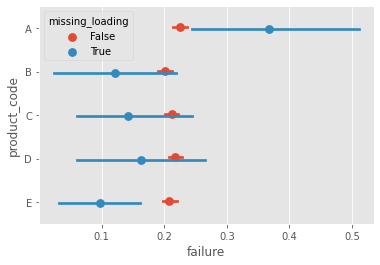

In [64]:
train["missing_loading"] = train.loading.isna().astype("category")
sns.pointplot(data=train, x="failure", y="product_code", hue = "missing_loading", dodge=True, join=False)

In [82]:
tmp.to_csv(pred_dir / name, index=False)

In [83]:
tmp.isna().sum()

id         0
failure    0
dtype: int64

In [84]:
for i in range(3, 18):
    newcol = f"meas{i}_dec"
    train[newcol] = train[f"measurement_{i}"] % 1
train

,id,product_code,loading,attribute_0,attribute_1,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,...,meas8_dec,meas9_dec,meas10_dec,meas11_dec,meas12_dec,meas13_dec,meas14_dec,meas15_dec,meas16_dec,meas17_dec
0,0,A,80.10,material_7,material_8,9,5,7,8,4,...,0.155,0.672,0.859,0.594,0.193,0.029,NaN,0.034,0.684,0.100
1,1,A,84.89,material_7,material_8,9,5,14,3,3,...,0.889,0.448,0.947,0.915,0.755,0.732,0.425,0.395,0.631,0.057
2,2,A,82.43,material_7,material_8,9,5,12,1,5,...,0.288,0.715,0.607,NaN,0.798,0.711,0.631,0.094,0.946,0.376
3,3,A,101.07,material_7,material_8,9,5,13,2,6,...,0.060,0.471,0.346,0.377,0.020,0.250,0.562,0.154,0.172,0.282
4,4,A,188.06,material_7,material_8,9,5,9,2,8,...,0.093,0.337,0.082,0.932,0.428,0.182,0.760,0.153,0.412,0.885
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26565,26565,E,158.95,material_7,material_6,6,9,6,16,4,...,0.354,NaN,0.177,0.942,0.112,0.795,0.572,0.144,NaN,0.131
26566,26566,E,146.02,material_7,material_6,6,9,10,12,8,...,0.563,0.242,0.179,0.564,0.234,0.450,0.322,0.146,0.471,0.924
26567,26567,E,115.62,material_7,material_6,6,9,1,10,1,...,0.279,0.407,0.437,0.476,0.668,0.069,0.599,0.590,0.065,0.364
26568,26568,E,106.38,material_7,material_6,6,9,2,9,4,...,0.358,0.392,0.064,0.814,0.928,0.273,0.485,0.624,0.865,0.156


Done! Use 'show' commands to display/save.   |██████████| [100%]   00:05 -> (00:00 left)



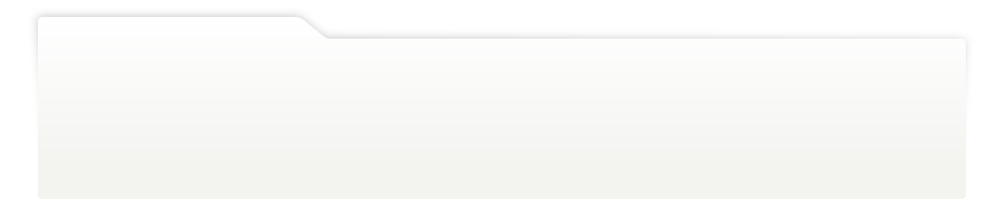
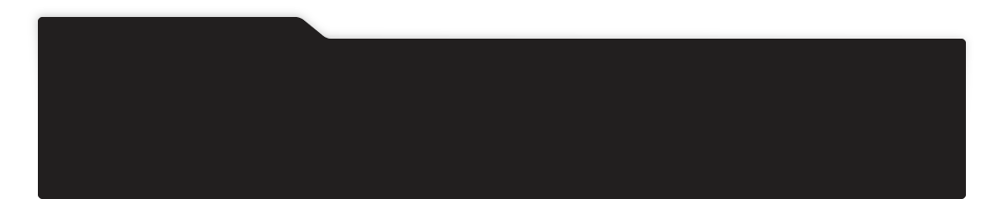
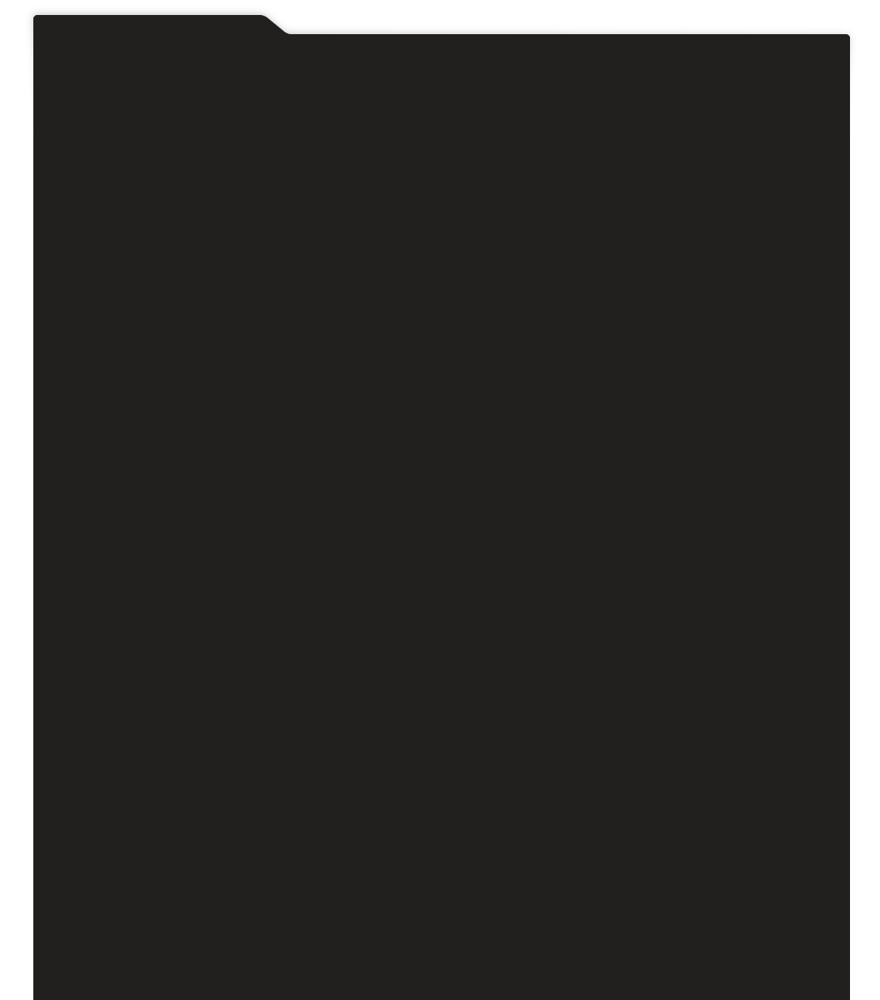
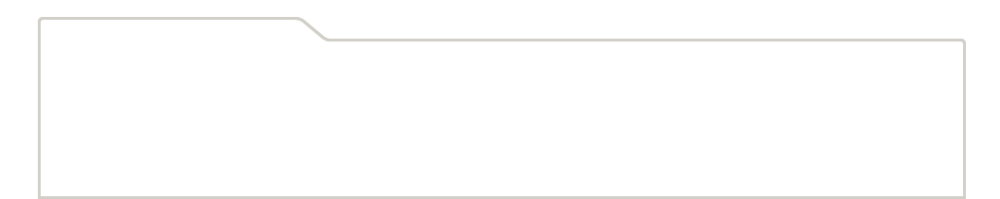
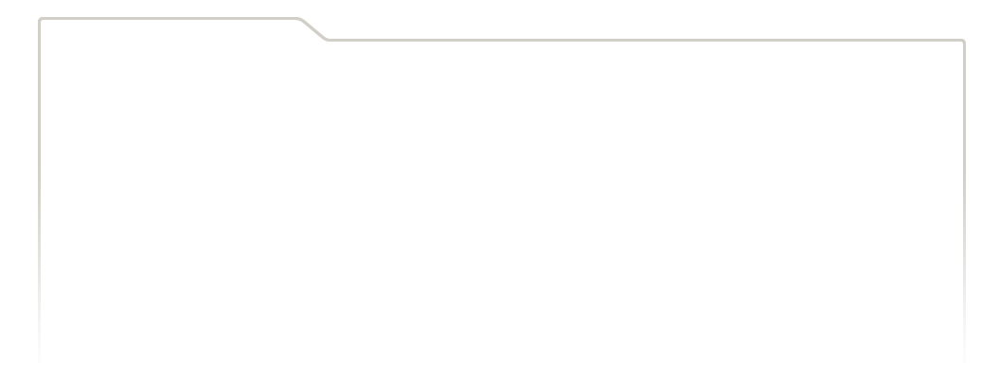
...
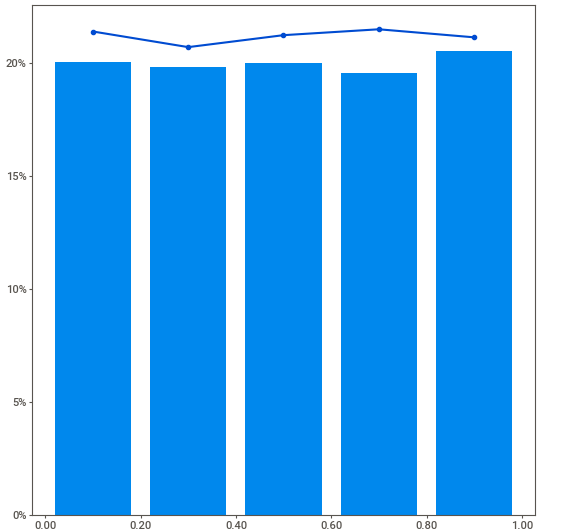
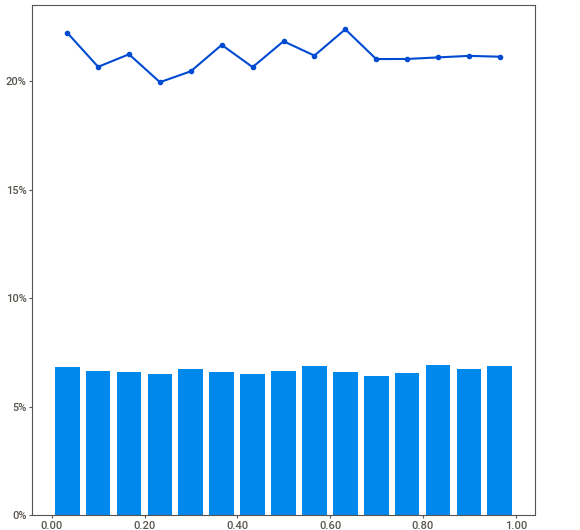
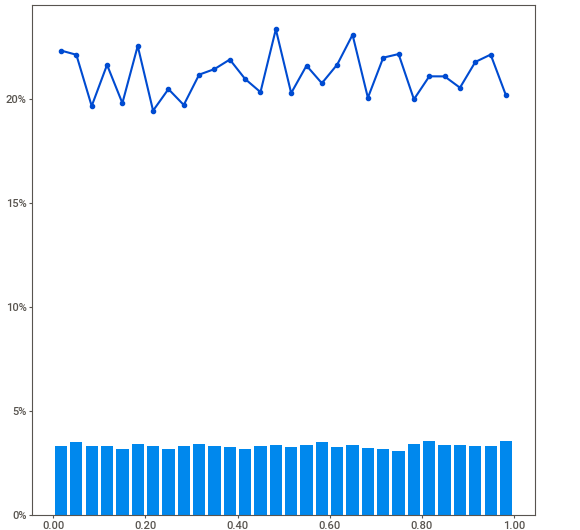
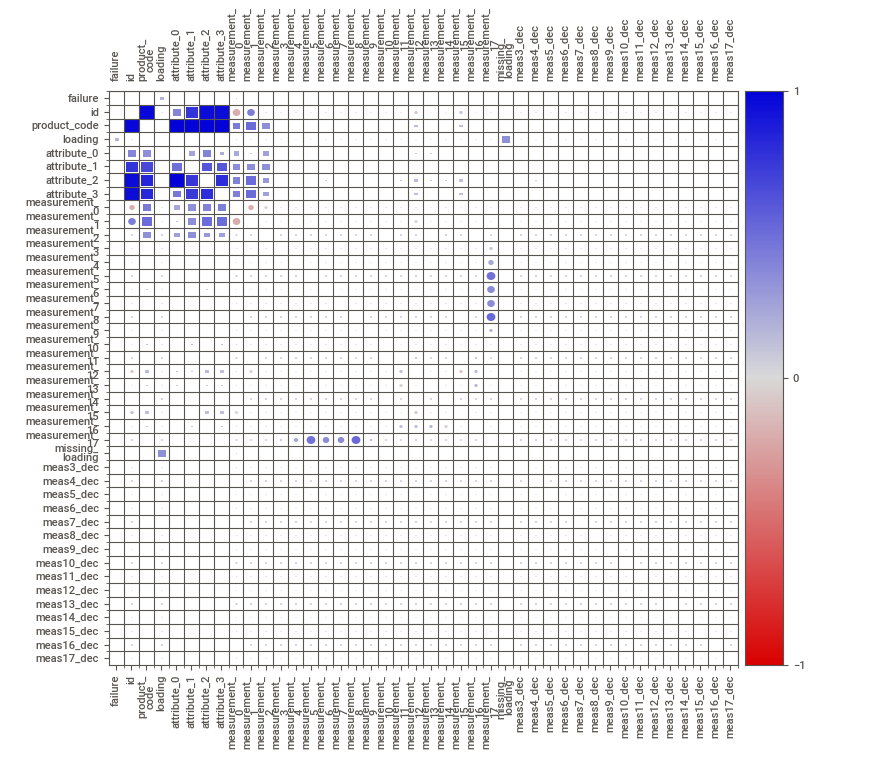
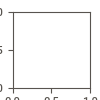

In [85]:
myrep = sv.analyze(train, target_feat="failure")
myrep.show_notebook()